# 🎓 Redes Neurais Recorrentes (RNN) e Long Short-Term Memory (LSTM)
**Disciplina:** REDES NEURAIS ARTIFICIAIS, DEEP LEARNING E ALGORITMOS GENÉTICOS
**Curso:** Tecnólogo em Inteligência Artificial  

---

## 🎯 Objetivos de Aprendizagem

Ao final desta aula prática, você será capaz de:
1. **Compreender** por que arquiteturas tradicionais (MLP e CNN) falham ao processar dados com dependência temporal implícita (sequências).
2. **Explicar** a arquitetura de uma **Rede Neural Recorrente (Vanilla RNN)** e a importância do estado oculto (*hidden state*) como memória da rede.
3. **Identificar** os problemas do **Gradiente Desvanecente (*Vanishing Gradient*)** e **Gradiente Explosivo (*Exploding Gradient*)** no treinamento de RNNs em sequências longas.
4. **Compreender** a arquitetura de uma **LSTM (Long Short-Term Memory)** e o papel de seus mecanismos de controle: *Cell State* e Portas (*Forget Gate*, *Input Gate*, *Output Gate*).
5. **Preparar** dados temporais reais utilizando a técnica de **Janelamento Deslizante (*Sliding Window*)** e formatação 3D para o Keras `(samples, time_steps, features)`.
6. **Construir, treinar e comparar** três modelos no Keras: MLP Baseline, Vanilla SimpleRNN e LSTM.
7. **Visualizar e Interpretar** gráficos comparativos de predição em dados de teste reais, calculando métricas de erro (**RMSE** e **MAE**).
8. **Reconhecer** o papel atual das LSTMs na indústria em problemas reais (Finanças, Preditividade de Demanda, NLP e Manutenção Preditiva).

## 1. Importação de Bibliotecas e Configuração do Ambiente

In [ ]:
!pip install yfinance -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf

import tensorflow as tf
from tensorflow.keras import models, layers
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Estilo gráfico
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['font.size'] = 12

# Reprodutibilidade
# Reprodutibilidade
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

print(f"Versão do TensorFlow: {tf.__version__}")

## 2. Carregamento e Análise do Dataset Real (PETR4.SA)

In [ ]:
ticker = "PETR4.SA"

df = yf.download(
    ticker,
    start="2018-01-01",
    end="2024-01-01",
    progress=False,
    auto_adjust=True
)

df = df[["Close"]].dropna()

print(f"Total de registros: {len(df)}")
display(df.head())

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(df.index, df['Close'], color='#1f77b4', linewidth=2, label='Preço de Fechamento (R$)')
plt.title(f'Série Temporal Histórica — {ticker} (2018 - 2024)', fontsize=14, fontweight='bold')
plt.xlabel('Data')
plt.ylabel('Preço (R$)')
plt.legend()
plt.show()

## 3. Pré-processamento: Janelamento Deslizante (*Sliding Window*)

O Keras exige que entradas recorrentes tenham o formato 3D:
$$\text{Formato 3D} = (samples, time\_steps, features)$$

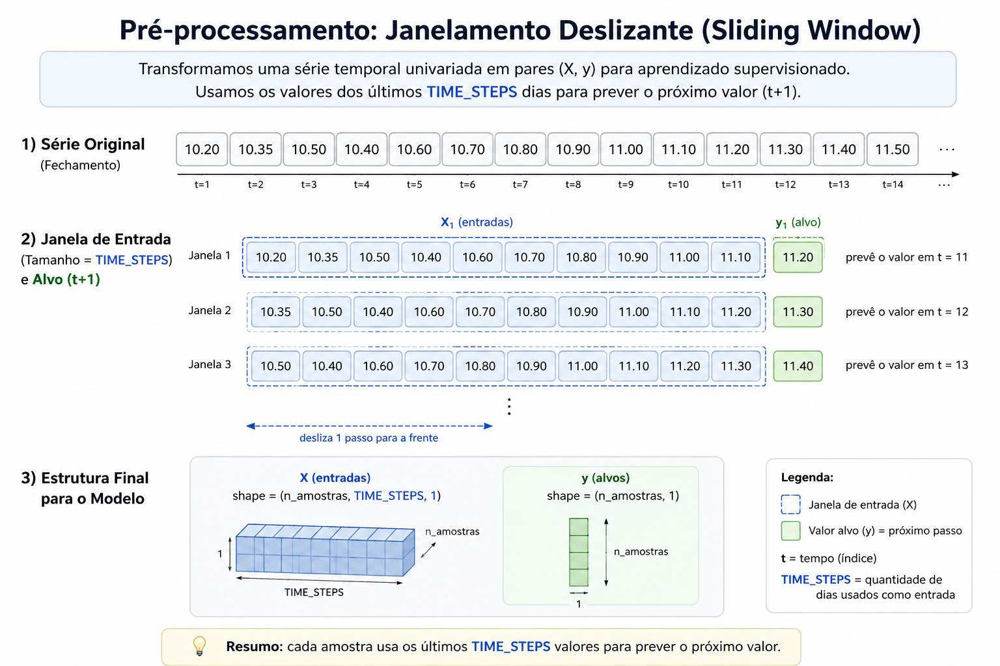

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import gc

# ============================================================
# 1. Divisão temporal: treino / validação / teste
# ============================================================

train_size = int(len(df) * 0.70)
val_size = int(len(df) * 0.15)

train_raw = df['Close'].values[:train_size]
val_raw = df['Close'].values[train_size:train_size + val_size]
test_raw = df['Close'].values[train_size + val_size:]

In [ ]:
# ============================================================
# 2. Normalização
#    O scaler é ajustado SOMENTE no treino
# ============================================================

scaler = MinMaxScaler(feature_range=(0, 1))

train_data = scaler.fit_transform(
    train_raw.reshape(-1, 1)
).astype(np.float32)

val_data = scaler.transform(
    val_raw.reshape(-1, 1)
).astype(np.float32)

test_data = scaler.transform(
    test_raw.reshape(-1, 1)
).astype(np.float32)

In [ ]:
# ============================================================
# 3. Criação das sequências
# ============================================================

def create_sequences(data, time_steps=60):

    n_samples = len(data) - time_steps

    X = np.empty(
        (n_samples, time_steps),
        dtype=np.float32
    )

    y = np.empty(
        n_samples,
        dtype=np.float32
    )

    for i in range(n_samples):
        X[i] = data[i:i + time_steps, 0]
        y[i] = data[i + time_steps, 0]

    return X, y


TIME_STEPS = 60

X_train, y_train = create_sequences(train_data, TIME_STEPS)
X_val, y_val = create_sequences(val_data, TIME_STEPS)
X_test, y_test = create_sequences(test_data, TIME_STEPS)

In [ ]:
# ============================================================
# 4. Ajuste para entrada das redes recorrentes
#    (amostras, timesteps, features)
# ============================================================

X_train = X_train.reshape(
    (X_train.shape[0], X_train.shape[1], 1)
)

In [ ]:
X_val = X_val.reshape(
    (X_val.shape[0], X_val.shape[1], 1)
)

In [ ]:
X_test = X_test.reshape(
    (X_test.shape[0], X_test.shape[1], 1)
)

In [ ]:
# ============================================================
# 5. Liberar memória desnecessária
# ============================================================

del train_raw, val_raw, test_raw
del train_data, val_data, test_data

gc.collect()

# ============================================================
# 6. Verificação
# ============================================================

print(f"X_train: {X_train.shape} - {X_train.dtype}")
print(f"y_train: {y_train.shape} - {y_train.dtype}")

print(f"X_val:   {X_val.shape} - {X_val.dtype}")
print(f"y_val:   {y_val.shape} - {y_val.dtype}")

print(f"X_test:  {X_test.shape} - {X_test.dtype}")
print(f"y_test:  {y_test.shape} - {y_test.dtype}")

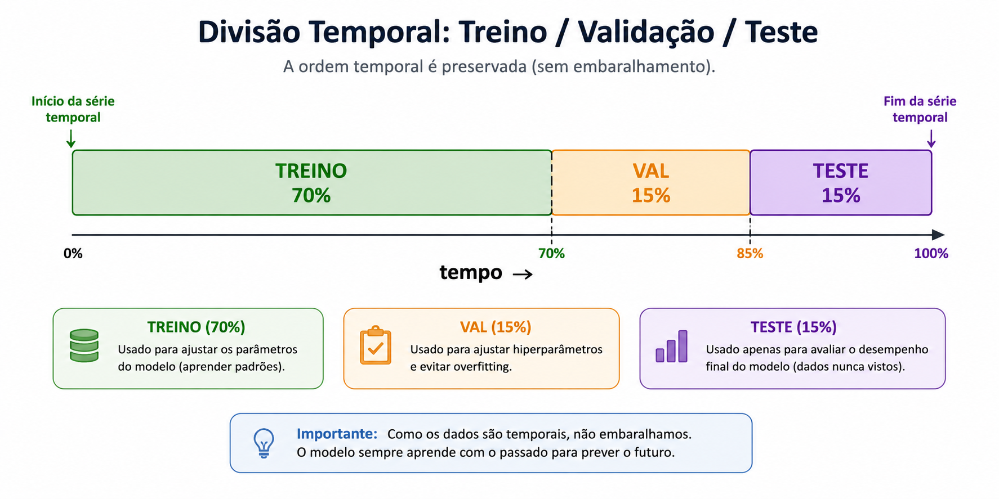

## 4. Modelo 1: Baseline MLP (Flatten da Janela)

In [ ]:
# TODO Crie um modelo MLP Baseline com input shape=(TIME_STEPS, 1), seguido por
# uma camada Flatten, depois uma camada Dense com 64 neurônios com activation='relu'
# seguida por uma camada Dropout com 0.2, depois uma camada Dense com 32 neurônios
# seguida por uma camda de dropout com 0.1 e por fim uma camada Dense final com 1 neurônio
mlp_model = ...

In [ ]:
print("MLP Definida!")

In [ ]:
# TODO Crie o compilador com optimizer='adam' e loss='mse'
mlp_model.compile(...)
mlp_model.summary()

In [ ]:
# TODO Treine com X_train, y_train, validation_data=(X_val, y_val), epochs=150,
# e batch_size=32,
history_mlp = mlp_model.fit(...)

In [ ]:
print("MLP Treinado com sucesso!")

## 5. Modelo 2: Vanilla SimpleRNN

#### MLP

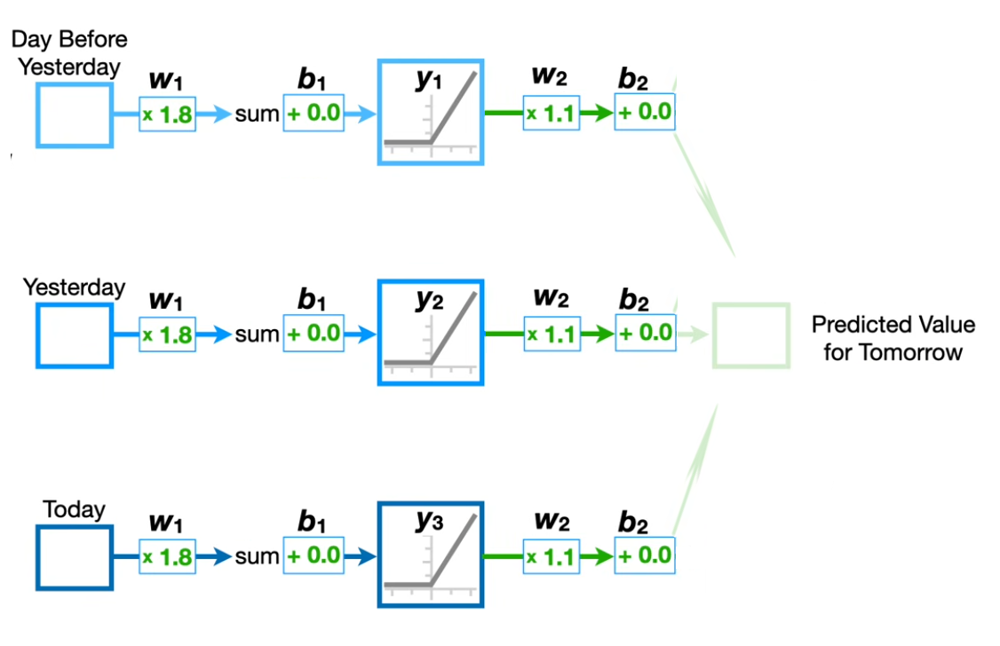

#### RNNN

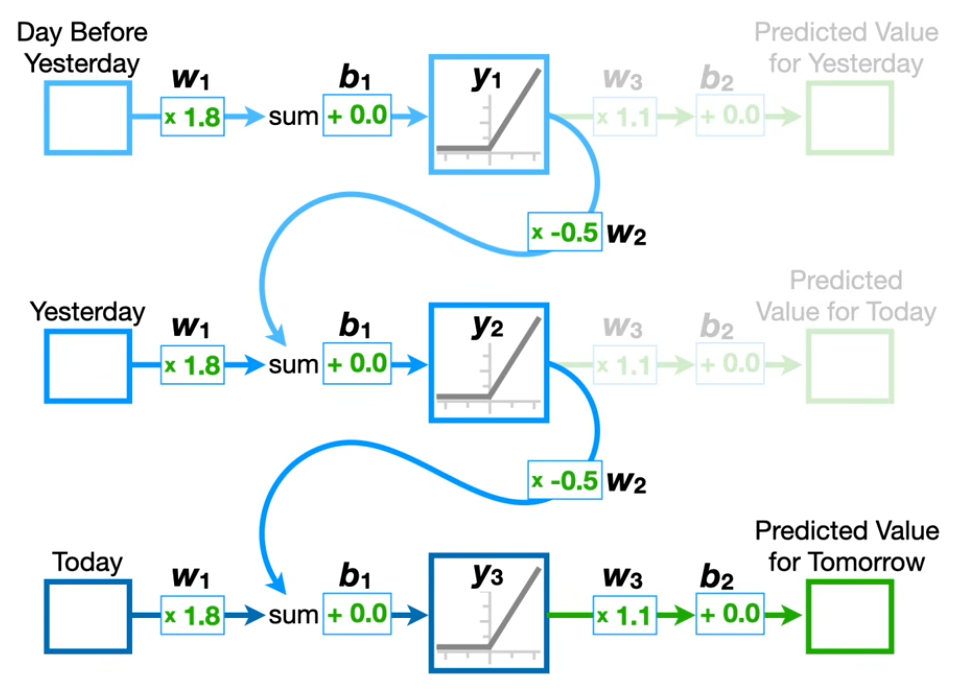

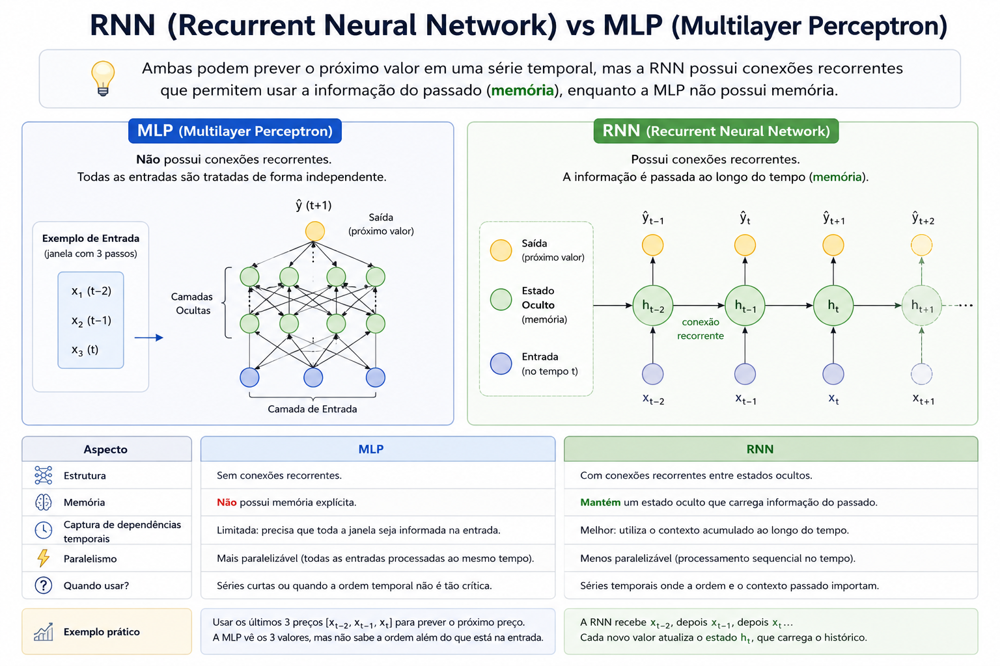

In [ ]:
# TODO Crie uma RNN tendo como input shape shape=(TIME_STEPS, 1),
# uma SimpleRNN com 64 neurônios seguida por uma camda de Dropout de 0.2
# depois uma cama Dense com 32 neurônios e activation='relu' seguido por uma camada de Dropout de 0.1,
# e por fim uma camda Dense de 1 neurônio
rnn_model = ...

In [ ]:
# TODO Crie o compilador com optimizer='adam' e loss='mse'
rnn_model.compile(...)
rnn_model.summary()

In [ ]:
# TODO Treine com X_train, y_train, validation_data=(X_val, y_val), epochs=150,
# e batch_size=32,
history_rnn = rnn_model.fit(...)
print("SimpleRNN Treinada com sucesso!")

#### Deficiências da RNN

#### 📉 O Dilema das RNNs: Explodindo ou Desvanecendo

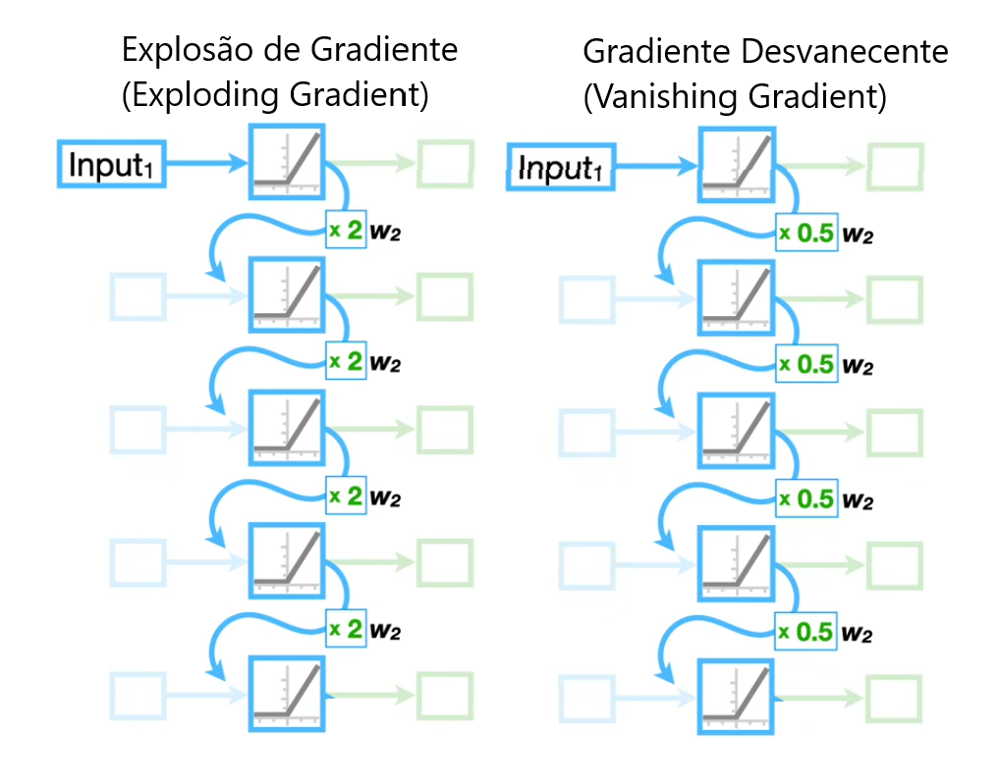

##### **Explosão de Gradiente (Exploding Gradient)**
Imagine que estamos processando uma sequência de apenas 50 dias de dados de mercado — o que, em termos de séries temporais financeiras, é um período relativamente curto.Se o valor absoluto dos pesos for maior que 1, a regra da cadeia do cálculo nos leva a uma progressão geométrica:$$\text{Gradiente} \approx \text{Input}_1 \times W^{50}$$Se simplificarmos o peso como um fator de crescimento (ex: 2), teremos:$$\text{Gradiente} \approx \text{Input}_1 \times 2^{50}$$O impacto: $2^{50}$ é um número astronômico (aproximadamente $1.12 \times 10^{15}$). Esse crescimento exponencial faz com que os gradientes fiquem tão grandes que os pesos da rede se tornam instáveis, resultando em:
- Overflow numérico: O erro torna-se NaN (Not a Number).
- Instabilidade: Os pesos oscilam violentamente, tornando impossível a convergência para um mínimo.

##### **Gradiente Desvanecente (Vanishing Gradient)**
Por outro lado, se os pesos forem menores que 1 (ex: 0.5), ocorre o efeito oposto. A informação gradiente "encolhe" a cada passo de tempo retrocedido:$$\text{Gradiente} \approx \text{Input}_1 \times 0.5^{50}$$O Impacto: $0.5^{50}$ resulta em um valor extremamente próximo de zero ($8.88 \times 10^{-16}$).
Consequência prática:
- A rede "esquece" o que aconteceu no início da sequência. Como o gradiente quase desaparece, os pesos das camadas iniciais deixam de ser atualizados. A rede torna-se incapaz de aprender dependências de longo prazo (ex: um padrão que ocorreu há 50 dias não influencia mais a decisão de hoje).

## 6. Modelo 3: Long Short-Term Memory (LSTM)

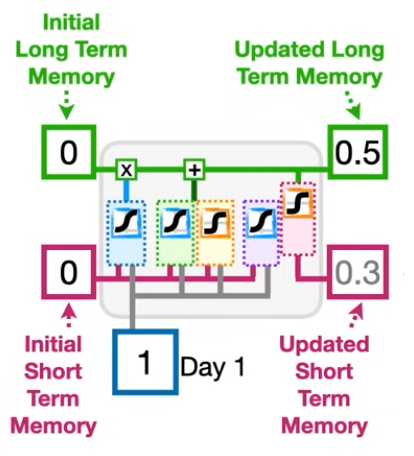

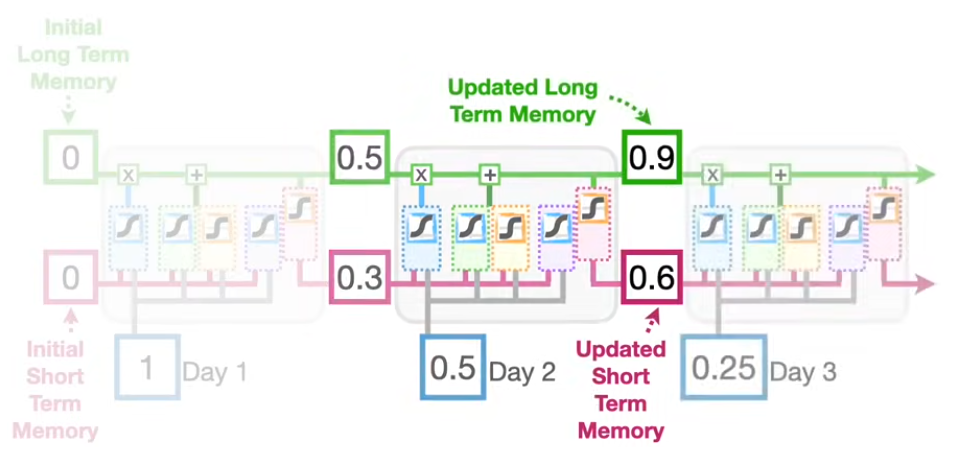

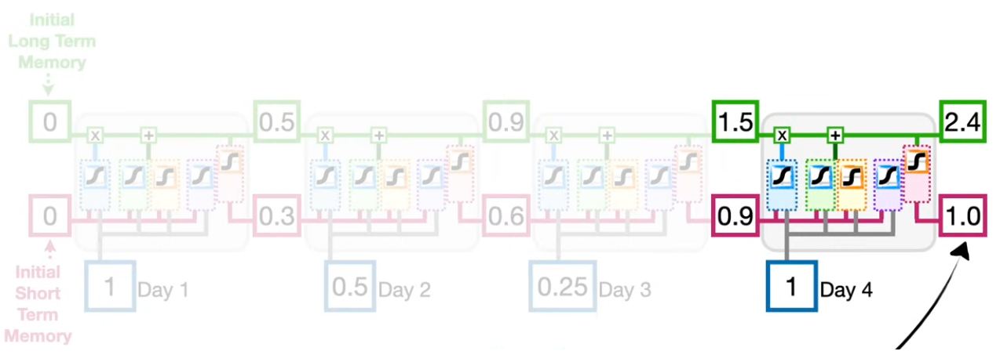

### Componentes da LSTM (Gates)

#### Forget Gate

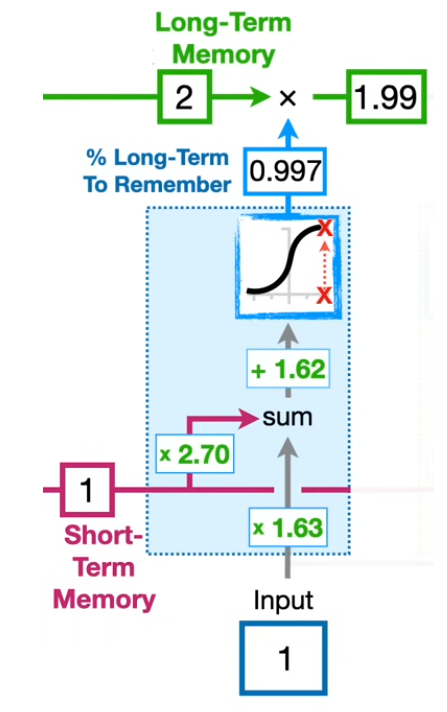

#### Input Gate

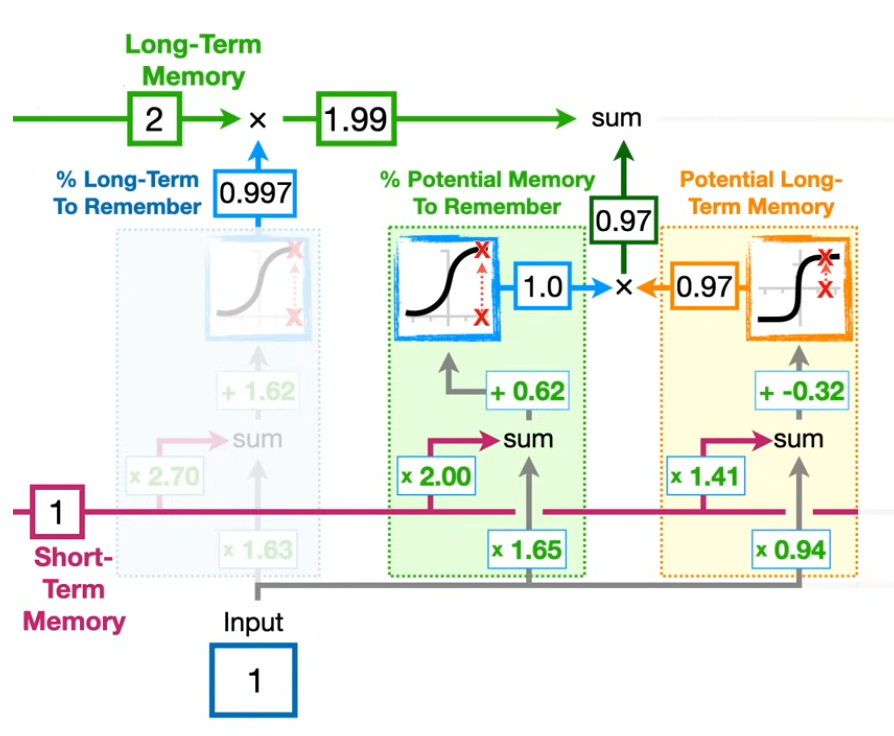

#### Output Gate

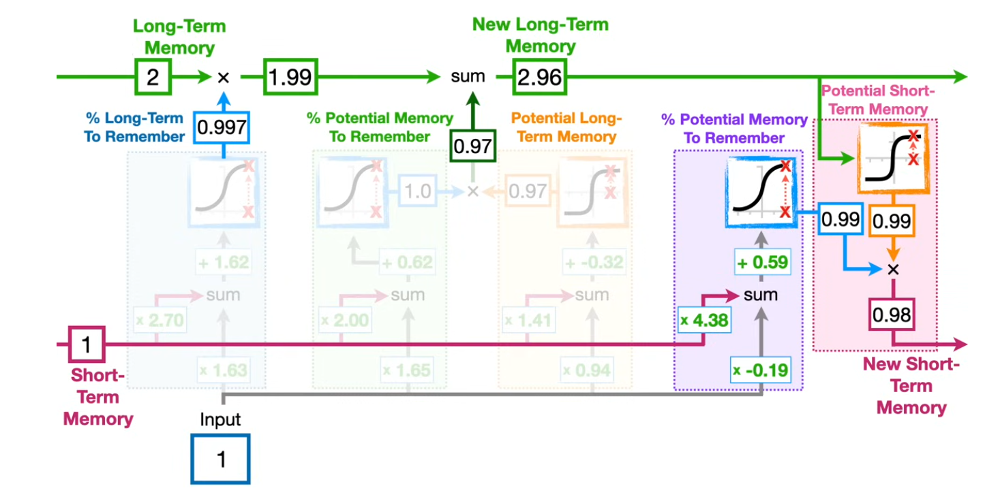

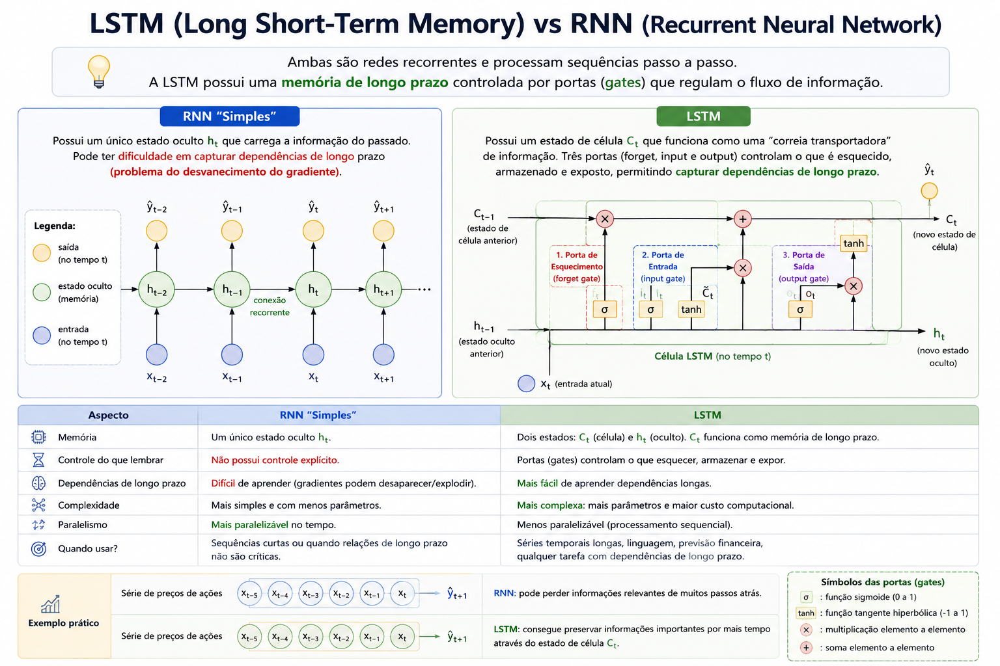

In [ ]:
# TODO Crie uma LSTM tendo como input shape shape=(TIME_STEPS, 1),
# uma SimpleRNN com 64 neurônios seguida por uma camda de Dropout de 0.2
# depois uma cama Dense com 32 neurônios e activation='relu' seguido por uma camada de Dropout de 0.1,
# e por fim uma camda Dense de 1 neurônio
lstm_model = ...

In [ ]:
# TODO Crie o compilador com optimizer='adam' e loss='mse'
lstm_model.compile(...)
lstm_model.summary()

In [ ]:
# TODO Treine com X_train, y_train, validation_data=(X_val, y_val), epochs=150,
# e batch_size=32
history_lstm = lstm_model.fit(...)
print("LSTM Treinada com sucesso!")

## 7. Avaliação de Desempenho e Visualização de Impacto

In [ ]:
pred_mlp = mlp_model.predict(X_test, verbose=0)
pred_rnn = rnn_model.predict(X_test, verbose=0)
pred_lstm = lstm_model.predict(X_test, verbose=0)

y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
pred_mlp_real = scaler.inverse_transform(pred_mlp)
pred_rnn_real = scaler.inverse_transform(pred_rnn)
pred_lstm_real = scaler.inverse_transform(pred_lstm)

metrics = []
for name, pred in zip(['MLP Baseline', 'SimpleRNN', 'LSTM'], [pred_mlp_real, pred_rnn_real, pred_lstm_real]):
    rmse = np.sqrt(mean_squared_error(y_test_real, pred))
    mae = mean_absolute_error(y_test_real, pred)
    metrics.append({'Modelo': name, 'RMSE (R$)': rmse, 'MAE (R$)': mae})

df_metrics = pd.DataFrame(metrics)
display(df_metrics)

plt.figure(figsize=(16, 7))
plt.plot(y_test_real, label='Valor Real (PETR4)', color='black', linewidth=2.5, linestyle='--')
plt.plot(pred_mlp_real, label='MLP Baseline', color='#e74c3c', alpha=0.7)
plt.plot(pred_rnn_real, label='SimpleRNN', color='#f39c12', alpha=0.8)
plt.plot(pred_lstm_real, label='LSTM (Proposto)', color='#2ecc71', linewidth=2)
plt.title('Comparação Prática de Predição: Real vs. MLP vs. SimpleRNN vs. LSTM', fontsize=14, fontweight='bold')
plt.xlabel('Dias de Teste')
plt.ylabel('Preço (R$)')
plt.legend(fontsize=12)
plt.show()

---

## 8. Interpretabilidade e XAI: O que aconteceu dentro de cada rede?


In [ ]:
!pip install -U shap -q

In [ ]:
# ============================================================
# XAI — COMPARAÇÃO MLP vs SimpleRNN vs LSTM
# Permutation Importance ao longo dos 30 timesteps
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error

# ------------------------------------------------------------
# CONFIGURAÇÃO
# ------------------------------------------------------------

N_SAMPLES = 100      # amostras utilizadas na explicação
N_REPEATS = 3        # repetições do embaralhamento
TIME_STEPS = X_test.shape[1]

models_dict = {
    "MLP": mlp_model,
    "SimpleRNN": rnn_model,
    "LSTM": lstm_model
}

# ------------------------------------------------------------
# FUNÇÃO DE IMPORTÂNCIA
# ------------------------------------------------------------

def permutation_importance_timeseries(model, X, y, n_repeats=3):

    # Erro original
    pred_original = model.predict(
        X,
        verbose=0
    ).reshape(-1)

    mae_original = mean_absolute_error(
        y,
        pred_original
    )

    importances = np.zeros(TIME_STEPS)

    for t in range(TIME_STEPS):

        scores = []

        for _ in range(n_repeats):

            X_perm = X.copy()

            # Embaralha apenas o timestep t
            X_perm[:, t, 0] = np.random.permutation(
                X_perm[:, t, 0]
            )

            # Nova previsão
            pred_perm = model.predict(
                X_perm,
                verbose=0
            ).reshape(-1)

            # Aumento do erro
            mae_perm = mean_absolute_error(
                y,
                pred_perm
            )

            scores.append(
                mae_perm - mae_original
            )

        importances[t] = np.mean(scores)

    return importances


# ------------------------------------------------------------
# DADOS UTILIZADOS NA EXPLICAÇÃO
# ------------------------------------------------------------

X_xai = X_test[:N_SAMPLES].copy()
y_xai = y_test[:N_SAMPLES].copy()


# ------------------------------------------------------------
# CALCULAR IMPORTÂNCIA DOS 3 MODELOS
# ------------------------------------------------------------

results = {}

for name, model in models_dict.items():

    print(f"Calculando XAI para {name}...")

    results[name] = permutation_importance_timeseries(
        model,
        X_xai,
        y_xai,
        n_repeats=N_REPEATS
    )


# ------------------------------------------------------------
# DATAFRAME COM RESULTADOS
# ------------------------------------------------------------

df_xai = pd.DataFrame(
    results,
    index=np.arange(1, TIME_STEPS + 1)
)

df_xai.index.name = "Timestep"


# ------------------------------------------------------------
# NORMALIZAÇÃO PARA FACILITAR COMPARAÇÃO VISUAL
# ------------------------------------------------------------

df_xai_norm = df_xai / df_xai.abs().max()


# ------------------------------------------------------------
# GRÁFICO COMPARATIVO
# ------------------------------------------------------------

plt.figure(figsize=(16, 7))

for model_name in models_dict.keys():

    plt.plot(
        df_xai_norm.index,
        df_xai_norm[model_name],
        marker="o",
        linewidth=2,
        label=model_name
    )

plt.axhline(
    0,
    color="black",
    linewidth=1
)

plt.xlabel("Posição na janela temporal")
plt.ylabel("Importância relativa")
plt.title(
    "XAI — Comparação da importância dos timesteps"
)

plt.xticks(
    range(1, TIME_STEPS + 1)
)

plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# TOP 5 TIMESTEPS DE CADA MODELO
# ------------------------------------------------------------

print("\n=== TIMESTEPS MAIS IMPORTANTES ===")

for model_name in models_dict.keys():

    top = (
        df_xai[model_name]
        .abs()
        .nlargest(5)
        .index
        .tolist()
    )

    print(
        f"{model_name}: {top}"
    )

## 🧠 Interpretação do XAI — MLP vs. SimpleRNN vs. LSTM

### 📌 O que podemos observar?

**MLP:**  
A importância está bastante distribuída ao longo dos 60 timesteps e apresenta grandes oscilações. Isso indica que a MLP não possui memória temporal explícita e tende a tratar os valores da janela como entradas independentes, aprendendo relações específicas entre cada posição e a saída.

**SimpleRNN:**  
A importância permanece próxima de zero na maior parte da sequência. Entretanto, observa-se um aumento muito forte no último timestep. Isso sugere que a RNN está concentrando grande parte da decisão nas informações mais recentes, com menor influência dos timesteps mais antigos.

**LSTM:**  
A LSTM também concentra sua atenção nas posições mais recentes, mas apresenta um crescimento mais gradual da importância nos últimos timesteps. Isso é coerente com sua capacidade de manter e controlar informações ao longo da sequência por meio do estado de célula e das portas (*gates*).

### 💡 Interpretação geral

O gráfico ilustra uma diferença importante entre as arquiteturas:

**MLP →** importância mais distribuída e sem mecanismo explícito de memória  
**RNN →** maior dependência dos valores mais recentes  
**LSTM →** maior capacidade de preservar informação temporal relevante ao longo da sequência

> **Importante:** a importância apresentada pelo método de XAI não significa necessariamente que um timestep "causou" a previsão. Ela indica apenas quanto aquele timestep contribuiu para a decisão do modelo segundo o método de explicabilidade utilizado.

## 9. Aplicações das LSTMs no Mercado Real

* **Mercado Financeiro:** Algoritmos de trading de alta frequência (HFT), previsão de volatilidade e risco.
* **Energia e Utilities:** Previsão de demanda de carga elétrica (*Load Forecasting*) em tempo real.
* **Manutenção Preditiva:** Monitoramento de vibração e temperatura para estimativa de vida útil (*RUL*).
* **Saúde e NLP:** Monitoramento de sinais vitais contínuos (ECG) e análise de sequências textuais.

# 10. Conclusão

Ao final da evolução apresentada na disciplina temos:

1. **MLP** → ignora estrutura espacial e temporal, tratando cada dado de entrada como independente.
2. **CNN construída do zero** → aprende filtros para extrair padrões espaciais e invariância a deslocamento em dados bidimensionais.
3. **Transfer Learning** → reutiliza conhecimento espacial previamente aprendido em milhões de imagens para novos domínios.
4. **Fine Tuning** → especializa camadas profundas de uma rede pré-treinada para o problema específico de negócio.
5. **SimpleRNN** → introduz o conceito de memória e estado oculto recorrente, mas sofre com a perda de memória de longo prazo devido ao gradiente desvanecente.
6. **LSTM** → resolve a dependência de longo prazo por meio de portas de controle (*Forget*, *Input*, *Output*) e do *Cell State*, tornando-se o padrão ouro para modelagem de séries temporais e dados sequenciais.